In [27]:
import tensorflow as tf 
import mitdeeplearning as mdl

# Import all remaining packages
import numpy as np
import os
import time
import functools
from IPython import display as ipythondisplay
from tqdm import tqdm
import matplotlib.pyplot as plt

%matplotlib inline

%reload_ext autoreload
%autoreload 2

## 2.2 Dataset

![Let's Dance!](http://33.media.tumblr.com/3d223954ad0a77f4e98a7b87136aa395/tumblr_nlct5lFVbF1qhu7oio1_500.gif)

We've gathered a dataset of thousands of Irish folk songs, represented in the ABC notation. Let's download the dataset and inspect it: 


In [32]:
# Download the dataset
songs = mdl.lab1.load_training_data()
tunes = [mdl.util.get_tune(song) for song in songs]
songs_joined = "Z".join(tunes) 

songs_joined = songs_joined.replace('Major', '%')
songs_joined = songs_joined.replace('Minor', '~')
songs_joined = songs_joined.replace('Dorian', 'O')
songs_joined = songs_joined.replace('Mixolydian', 'X')

Found 817 songs in text


In [29]:
keys = [tune.split('\n')[0][2:] for tune in tunes]

In [30]:
for letter in ['C', 'D', 'E', 'F', 'G', 'A', 'B']:
    cand_key = letter + ' Major'
    lst = [item == cand_key for item in keys]
    count = np.sum(lst)
    print(cand_key, count)
    
    cand_key = letter + ' Minor'
    lst = [item == cand_key for item in keys]
    count = np.sum(lst)
    print(cand_key, count)
    
    cand_key = letter + ' Dorian'
    lst = [item == cand_key for item in keys]
    count = np.sum(lst)
    print(cand_key, count)
    
    cand_key = letter + ' Mixolydian'
    lst = [item == cand_key for item in keys]
    count = np.sum(lst)
    print(cand_key, count)

C Major 7
C Minor 0
C Dorian 0
C Mixolydian 0
D Major 229
D Minor 9
D Dorian 12
D Mixolydian 61
E Major 3
E Minor 23
E Dorian 49
E Mixolydian 0
F Major 9
F Minor 0
F Dorian 0
F Mixolydian 0
G Major 249
G Minor 0
G Dorian 6
G Mixolydian 5
A Major 36
A Minor 1
A Dorian 81
A Mixolydian 21
B Major 0
B Minor 8
B Dorian 5
B Mixolydian 0


In [5]:
# lst = [item == 'D Major' for item in keys]
# songlst = list(np.array(tunes)[lst])
# songs_joined = 'Z'.join(tunes)

# songs_joined = songs_joined.replace('Major', '%')
# songs_joined = songs_joined.replace('Minor', '~')
# songs_joined = songs_joined.replace('Dorian', 'O')
# songs_joined = songs_joined.replace('Mixolydian', 'X')

In [6]:
np.where(["Mixolydian" in tune for tune in songlst])

(array([ 19, 158, 170]),)

In [ ]:
# C -> G
transposed_songs_joinedG = mdl.util.replace_str2(songs_joined, {"G,": 'D', 
        "A,": 'E', "B,":'^F', "C":'G', 'D':'A',
        'E':'B', 'F':'c', 'G':'d', 'A':'e', 'B':'^f',
        'c':'g', 'd':'a', 'e':'b', 'f':"c'", 'g':"d'", 'a':"e'",
        'b':"^f'", "c'":"g'", "d'":"a'", "e'":"b'"})
# transposed_songs_joinedG = mdl.util.replace_key_signatures(transposed_songs_joinedG)

# C -> D
transposed_songs_joinedD = mdl.util.replace_str2(songs_joined, {"G,": 'A,', 
        "A,": 'B,', "B,":'^C', "C":'D', 'D':'E',
        'E':'^F', 'F':'G', 'G':'A', 'A':'B', 'B':'^c',
        'c':'d', 'd':'e', 'e':'^f', 'f':"g", 'g':"a", 'a':"b",
        'b':"^c'", "c'":"d'", "d'":"e'", "e'":"^f'"})
# transposed_songs_joinedD = mdl.util.replace_key_signatures(transposed_songs_joinedD)

transposed_songs_joinedA = mdl.util.replace_str2(songs_joined, {"G,": 'A,', 
        "A,": '^F,', "B,":'^G,', "C":'A,', 'D':'B,',
        'E':'^C', 'F':'D', 'G':'E', 'A':'^F', 'B':'^G',
        'c':'A', 'd':'B', 'e':'^c', 'f':"d", 'g':"e", 'a':"^f",
        'b':"^g'", "c'":"a'", "d'":"b'", "e'":"^c'"})
# transposed_songs_joinedD = mdl.util.replace_key_signatures(transposed_songs_joinedD)



In [ ]:
lst = songs_joined.split('Z')
print(lst[14])

In [34]:
# allsongs = 'Z'.join([songs_joined, transposed_songs_joinedD,
#                      transposed_songs_joinedG, transposed_songs_joinedA])
allsongs = songs_joined
vectorized_songs, char2idx, idx2char = mdl.util.vectorize_string(allsongs)

There are 62 unique characters in the dataset


In [35]:
len(allsongs)

153152

In [ ]:
# For listening to songs
transposed_songs = transposed_songs_joinedA.split('Z')

songstr = 'CDEF=F'
newsong = mdl.util.generate_song_with_key_tune(songstr, key='G Major')
mdl.lab1.play_song(newsong)

### Create training examples and targets

Our next step is to actually divide the text into example sequences that we'll use during training. Each input sequence that we feed into our RNN will contain `seq_length` characters from the text. We'll also need to define a target sequence for each input sequence, which will be used in training the RNN to predict the next character. For each input, the corresponding target will contain the same length of text, except shifted one character to the right.

To do this, we'll break the text into chunks of `seq_length+1`. Suppose `seq_length` is 4 and our text is "Hello". Then, our input sequence is "Hell" and the target sequence is "ello".

The batch method will then let us convert this stream of character indices to sequences of the desired size.

In [37]:
### Batch definition to create training examples ###

def get_batch(vectorized_songs, seq_length, batch_size):
  # the length of the vectorized songs string
  n = vectorized_songs.shape[0] - 1
  # randomly choose the starting indices for the examples in the training batch
  idx = np.random.choice(n-seq_length, batch_size)

  '''TODO: construct a list of input sequences for the training batch'''
  input_batch = [vectorized_songs[i : i+seq_length] for i in idx]
  # input_batch = # TODO
  '''TODO: construct a list of output sequences for the training batch'''
  output_batch = [vectorized_songs[i+1 : i+seq_length+1] for i in idx]
  # output_batch = # TODO

  # x_batch, y_batch provide the true inputs and targets for network training
  x_batch = np.reshape(input_batch, [batch_size, seq_length])
  y_batch = np.reshape(output_batch, [batch_size, seq_length])
  return x_batch, y_batch


# Perform some simple tests to make sure your batch function is working properly! 
test_args = (vectorized_songs, 10, 2)
if not mdl.lab1.test_batch_func_types(get_batch, test_args) or \
   not mdl.lab1.test_batch_func_shapes(get_batch, test_args) or \
   not mdl.lab1.test_batch_func_next_step(get_batch, test_args): 
   print("======\n[FAIL] could not pass tests")
else: 
   print("======\n[PASS] passed all tests!")

[PASS] test_batch_func_types
[PASS] test_batch_func_shapes
[PASS] test_batch_func_next_step
[PASS] passed all tests!


For each of these vectors, each index is processed at a single time step. So, for the input at time step 0, the model receives the index for the first character in the sequence, and tries to predict the index of the next character. At the next timestep, it does the same thing, but the RNN considers the information from the previous step, i.e., its updated state, in addition to the current input.

We can make this concrete by taking a look at how this works over the first several characters in our text:

## 2.4 The Recurrent Neural Network (RNN) model

Now we're ready to define and train a RNN model on our ABC music dataset, and then use that trained model to generate a new song. We'll train our RNN using batches of song snippets from our dataset, which we generated in the previous section.

The model is based off the LSTM architecture, where we use a state vector to maintain information about the temporal relationships between consecutive characters. The final output of the LSTM is then fed into a fully connected [`Dense`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense) layer where we'll output a softmax over each character in the vocabulary, and then sample from this distribution to predict the next character. 

As we introduced in the first portion of this lab, we'll be using the Keras API, specifically, [`tf.keras.Sequential`](https://www.tensorflow.org/api_docs/python/tf/keras/models/Sequential), to define the model. Three layers are used to define the model:

* [`tf.keras.layers.Embedding`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Embedding): This is the input layer, consisting of a trainable lookup table that maps the numbers of each character to a vector with `embedding_dim` dimensions.
* [`tf.keras.layers.LSTM`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM): Our LSTM network, with size `units=rnn_units`. 
* [`tf.keras.layers.Dense`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense): The output layer, with `vocab_size` outputs.


<img src="https://raw.githubusercontent.com/aamini/introtodeeplearning/2019/lab1/img/lstm_unrolled-01-01.png" alt="Drawing"/>

### Define the RNN model

Now, we will define a function that we will use to actually build the model.

In [38]:
def LSTM(rnn_units): 
  return tf.keras.layers.LSTM(
    rnn_units, 
    return_sequences=True, 
    recurrent_initializer='glorot_uniform',
    recurrent_activation='sigmoid',
    stateful=True,
  )

### Defining the RNN Model ###
# model = Sequential()
#     model.add(LSTM(
#         256,
#         input_shape=(network_input.shape[1], network_input.shape[2]),
#         return_sequences=True
#     ))
#     model.add(Dropout(0.3))
#     model.add(LSTM(512, return_sequences=True))
#     model.add(Dropout(0.3))
#     model.add(LSTM(256))
#     model.add(Dense(256))
#     model.add(Dropout(0.3))
#     model.add(Dense(n_vocab))
#     model.add(Activation('softmax'))
#     model.compile(loss='categorical_crossentropy', optimizer='rmsprop')

'''TODO: Add LSTM and Dense layers to define the RNN model using the Sequential API.'''
def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
  model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, batch_input_shape=[batch_size, None]),
    LSTM(rnn_units), 
    LSTM(256),
    tf.keras.layers.Dense(256),
    tf.keras.layers.Dense(vocab_size)
  ])

  return model

def build_model_v1(vocab_size, embedding_dim, rnn_units, batch_size):
  model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, batch_input_shape=[batch_size, None]),
    LSTM(rnn_units),    
    tf.keras.layers.Dense(vocab_size)
  ])

  return model


def compute_loss(labels, logits):
  loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
  # loss = tf.keras.losses.sparse_categorical_crossentropy('''TODO''', '''TODO''', from_logits=True) # TODO
  return loss

## 2.5 Training the model: loss and training operations

Now it's time to train the model!

At this point, we can think of our next character prediction problem as a standard classification problem. Given the previous state of the RNN, as well as the input at a given time step, we want to predict the class of the next character -- that is, to actually predict the next character. 

To train our model on this classification task, we can use a form of the `crossentropy` loss (negative log likelihood loss). Specifically, we will use the [`sparse_categorical_crossentropy`](https://www.tensorflow.org/api_docs/python/tf/keras/losses/sparse_categorical_crossentropy) loss, as it utilizes integer targets for categorical classification tasks. We will want to compute the loss using the true targets -- the `labels` -- and the predicted targets -- the `logits`.

Let's first compute the loss using our example predictions from the untrained model: 

Let's start by defining some hyperparameters for training the model. To start, we have provided some reasonable values for some of the parameters. It is up to you to use what we've learned in class to help optimize the parameter selection here!

In [39]:
### Hyperparameter setting and optimization ###

# Optimization parameters:
num_training_iterations = 20000  # Increase this to train longer
batch_size = 32  # Experiment between 1 and 64
seq_length = 100  # Experiment between 50 and 500
learning_rate = 5e-4  # Experiment between 1e-5 and 1e-1

# Model parameters: 
vocab_size = len(idx2char)
embedding_dim = 256 
rnn_units = 1024  # Experiment between 1 and 2048

# Checkpoint location: 
checkpoint_dir = './training_checkpoints7'
checkpoint_prefix = os.path.join(checkpoint_dir, "my_ckpt")

Now, we are ready to define our training operation -- the optimizer and duration of training -- and use this function to train the model. You will experiment with the choice of optimizer and the duration for which you train your models, and see how these changes affect the network's output. Some optimizers you may like to try are [`Adam`](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam?version=stable) and [`Adagrad`](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adagrad?version=stable).

First, we will instantiate a new model and an optimizer. Then, we will use the [`tf.GradientTape`](https://www.tensorflow.org/api_docs/python/tf/GradientTape) method to perform the backpropagation operations. 

We will also generate a print-out of the model's progress through training, which will help us easily visualize whether or not we are minimizing the loss.

In [40]:
len(vectorized_songs)

153152

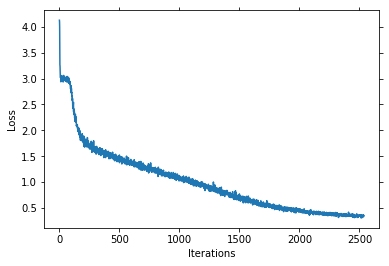

 13%|█▎        | 2538/20000 [1:27:36<8:25:28,  1.74s/it]

In [ ]:
### Define optimizer and training operation ###

'''TODO: instantiate a new model for training using the `build_model`
  function and the hyperparameters created above.'''
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size)
# model = build_model('''TODO: arguments''')

'''TODO: instantiate an optimizer with its learning rate.
  Checkout the tensorflow website for a list of supported optimizers.
  https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/
  Try using the Adam optimizer to start.'''
optimizer = tf.keras.optimizers.Adam(learning_rate)
# optimizer = # TODO

@tf.function
def train_step(x, y): 
  # Use tf.GradientTape()
  with tf.GradientTape() as tape:
  
    '''TODO: feed the current input into the model and generate predictions'''
    y_hat = model(x) # TODO
    # y_hat = model('''TODO''')
  
    '''TODO: compute the loss!'''
    loss = compute_loss(y, y_hat) # TODO
    # loss = compute_loss('''TODO''', '''TODO''')

  # Now, compute the gradients 
  '''TODO: complete the function call for gradient computation. 
      Remember that we want the gradient of the loss with respect all 
      of the model parameters. 
      HINT: use `model.trainable_variables` to get a list of all model
      parameters.'''
  grads = tape.gradient(loss, model.trainable_variables) # TODO
  # grads = tape.gradient('''TODO''', '''TODO''')
  
  # Apply the gradients to the optimizer so it can update the model accordingly
  optimizer.apply_gradients(zip(grads, model.trainable_variables))
  return loss

##################
# Begin training!#
##################

history = []
plotter = mdl.util.PeriodicPlotter(sec=2, xlabel='Iterations', ylabel='Loss')
if hasattr(tqdm, '_instances'): tqdm._instances.clear() # clear if it exists

for iter in tqdm(range(num_training_iterations)):

  # Grab a batch and propagate it through the network
  x_batch, y_batch = get_batch(vectorized_songs, seq_length, batch_size)
  loss = train_step(x_batch, y_batch)

  # Update the progress bar
  history.append(loss.numpy().mean())
  plotter.plot(history)

  # Update the model with the changed weights!
  if iter % 100 == 0:     
    model.save_weights(checkpoint_prefix)
    
# Save the trained model and the weights
model.save_weights(checkpoint_prefix)


In [19]:
history[-1]

0.1949778

## 2.6 Generate music using the RNN model

Now, we can use our trained RNN model to generate some music! When generating music, we'll have to feed the model some sort of seed to get it started (because it can't predict anything without something to start with!).

Once we have a generated seed, we can then iteratively predict each successive character (remember, we are using the ABC representation for our music) using our trained RNN. More specifically, recall that our RNN outputs a `softmax` over possible successive characters. For inference, we iteratively sample from these distributions, and then use our samples to encode a generated song in the ABC format.

Then, all we have to do is write it to a file and listen!

### Restore the latest checkpoint

To keep this inference step simple, we will use a batch size of 1. Because of how the RNN state is passed from timestep to timestep, the model will only be able to accept a fixed batch size once it is built. 

To run the model with a different `batch_size`, we'll need to rebuild the model and restore the weights from the latest checkpoint, i.e., the weights after the last checkpoint during training:

In [20]:
'''TODO: Rebuild the model using a batch_size=1'''
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size=1) # TODO
# model = build_model('''TODO''', '''TODO''', '''TODO''', batch_size=1)

# Restore the model weights for the last checkpoint after training
model.load_weights(tf.train.latest_checkpoint(checkpoint_dir))
model.build(tf.TensorShape([1, None]))

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (1, None, 256)            9984      
                                                                 
 lstm_4 (LSTM)               (1, None, 1024)           5246976   
                                                                 
 lstm_5 (LSTM)               (1, None, 256)            1311744   
                                                                 
 dense_4 (Dense)             (1, None, 256)            65792     
                                                                 
 dense_5 (Dense)             (1, None, 39)             10023     
                                                                 
Total params: 6,644,519
Trainable params: 6,644,519
Non-trainable params: 0
_________________________________________________________________


Notice that we have fed in a fixed `batch_size` of 1 for inference.

### The prediction procedure

Now, we're ready to write the code to generate text in the ABC music format:

* Initialize a "seed" start string and the RNN state, and set the number of characters we want to generate.

* Use the start string and the RNN state to obtain the probability distribution over the next predicted character.

* Sample from multinomial distribution to calculate the index of the predicted character. This predicted character is then used as the next input to the model.

* At each time step, the updated RNN state is fed back into the model, so that it now has more context in making the next prediction. After predicting the next character, the updated RNN states are again fed back into the model, which is how it learns sequence dependencies in the data, as it gets more information from the previous predictions.

![LSTM inference](https://raw.githubusercontent.com/aamini/introtodeeplearning/2019/lab1/img/lstm_inference.png)

Complete and experiment with this code block (as well as some of the aspects of network definition and training!), and see how the model performs. How do songs generated after training with a small number of epochs compare to those generated after a longer duration of training?

In [21]:
### Prediction of a generated song ###

def generate_text(model, start_string, generation_length=1000):
  # Evaluation step (generating ABC text using the learned RNN model)

  '''TODO: convert the start string to numbers (vectorize)'''
  input_eval = ['''TODO''']
  input_eval = tf.expand_dims(input_eval, 0)

  # Empty string to store our results
  text_generated = []

  # Here batch size == 1
  model.reset_states()
  tqdm._instances.clear()

  for i in tqdm(range(generation_length)):
      '''TODO: evaluate the inputs and generate the next character predictions'''
      predictions = model('''TODO''')
      
      # Remove the batch dimension
      predictions = tf.squeeze(predictions, 0)
      
      '''TODO: use a multinomial distribution to sample'''
      predicted_id = tf.random.categorical('''TODO''', num_samples=1)[-1,0].numpy()
      
      # Pass the prediction along with the previous hidden state
      #   as the next inputs to the model
      input_eval = tf.expand_dims([predicted_id], 0)
      
      '''TODO: add the predicted character to the generated text!'''
      # Hint: consider what format the prediction is in vs. the output
      text_generated.append('''TODO''')
    
  return (start_string + ''.join(text_generated))

In [22]:
'''TODO: Use the model and the function defined above to generate ABC format text of length 1000!
    As you may notice, ABC files start with "X" - this may be a good start string.'''
generated_text = mdl.lab1.generate_text(model, "A", char2idx, idx2char, generation_length=1000) # TODO
# generated_text = generate_text('''TODO''', start_string="X", generation_length=1000)

100%|██████████| 1000/1000 [00:11<00:00, 88.10it/s]


In [23]:
generated_text

'AFA D2:|!\nA|def def|dAF GFA|def dAF|DFA B2A|!\ndef def|ded def|gfe fdB|AFA B2:|!ZK:G %\nf|g3 B2A|GBA GBd|e3 edB|dBA ABA|!\nDGGG BGBd|c2AB cdef|gdBG FAdc|B2G2 G2:|!ZK:D %\nFE|D2FA dAFD|CDEF G2FE|D2FA dcdf|(3efg (3dcB (3ABA (3GFE|!\nD2FA dAFD|CDEF G2FG|AdcB AGFE|D2CE D2:|!\nde|fefg fedc|BABc B2cd|edef edcB|(3ABA ^GB A2 (3ABc|!\ndcde fdAF|GFGA BdcB|AdcB AGFE|D2CE D2:|!ZK:G O\nA|BABc dcd^f|g^fdf gabg|fdbg fdcd|BGA^F G=FDF|!\nG2GA BABG|FcFG AGFD|GABG dBGA|B2G2 G3:|!\nf|gfdf gabg|gfdf dBGA|BABc dcde|fcdB Agdc|!\nBGDG BdcB|AFDF ABcA|(3Bcd ef gecg|B2G2 G2ed|!\ncABG AcBA|GEDE GABd|(3efg fa gedB|c2A2 A2:|!ZK:G %\n(3DEF|GA (3GFE DG,B,D|GFGA Bdgf|edcB (3ABA GA|BAGF E2(3DEF|!\nGA (3GFE DG,B,D|GFGA Bdgf|edcB (3ABc (3GFA|(3dcB ^g efed|c2A2 A2:|!ZK:D %\nAG|F2FE DFAF|G2FG E3F|GFGA Bded|cege cAGE|!\nF2FE DFAF|G2FG E3F|GFGA Bded|cAGE D2:|!\n(3ABc|d2ad fded|FGFE DEFA|Beed Bded|cded ged|cAB cde|fed cAG|EAA A2:|!ZK:A O\nB|cAd cAG|EDE GAB|cAd cAG|EAA A2B|!\ncAd cAG|EDE GAB|cde fed|cAA A2:|!\nf|g3 ged|cAB c

In [26]:
generated_songs = generated_text.split('Z')
print(len(generated_songs))
song = generated_songs[3]
song = mdl.util.replace_key_signatures(song)
song = mdl.util.generate_song_with_key_tune(song)
print(song)
mdl.lab1.play_song(song)

7
X:1
T:Name
Z: id:dc-hornpipe-1
M:C|
L:1/8
K:G Dorian
A|BABc dcd^f|g^fdf gabg|fdbg fdcd|BGA^F G=FDF|!
G2GA BABG|FcFG AGFD|GABG dBGA|B2G2 G3:|!
f|gfdf gabg|gfdf dBGA|BABc dcde|fcdB Agdc|!
BGDG BdcB|AFDF ABcA|(3Bcd ef gecg|B2G2 G2ed|!
cABG AcBA|GEDE GABd|(3efg fa gedB|c2A2 A2:|!


In [ ]:
generated_songs

In [ ]:
print(song)

### Play back the generated music!

We can now call a function to convert the ABC format text to an audio file, and then play that back to check out our generated music! Try training longer if the resulting song is not long enough, or re-generating the song!

In [ ]:
### Play back generated songs ###

generated_songs = mdl.lab1.extract_song_snippet(generated_text)

for i, song in enumerate(generated_songs): 
  # Synthesize the waveform from a song
  waveform = mdl.lab1.play_song(song)

  # If its a valid song (correct syntax), lets play it! 
  if waveform:
    print("Generated song", i)
    ipythondisplay.display(waveform)

## 2.7 Experiment and **get awarded for the best songs**!

Congrats on making your first sequence model in TensorFlow! It's a pretty big accomplishment, and hopefully you have some sweet tunes to show for it.

Consider how you may improve your model and what seems to be most important in terms of performance. Here are some ideas to get you started:

*  How does the number of training epochs affect the performance?
*  What if you alter or augment the dataset? 
*  Does the choice of start string significantly affect the result? 

Try to optimize your model and submit your best song! **MIT students and affiliates will be eligible for prizes during the IAP offering**. To enter the competition, MIT students and affiliates should upload the following to the course Canvas:

* a recording of your song;
* iPython notebook with the code you used to generate the song;
* a description and/or diagram of the architecture and hyperparameters you used -- if there are any additional or interesting modifications you made to the template code, please include these in your description.

You can also tweet us at [@MITDeepLearning](https://twitter.com/MITDeepLearning) a copy of the song! See this example song generated by a previous 6.S191 student (credit Ana Heart): <a href="https://twitter.com/AnaWhatever16/status/1263092914680410112?s=20">song from May 20, 2020.</a>
<script async src="https://platform.twitter.com/widgets.js" charset="utf-8"></script>

Have fun and happy listening!

![Let's Dance!](http://33.media.tumblr.com/3d223954ad0a77f4e98a7b87136aa395/tumblr_nlct5lFVbF1qhu7oio1_500.gif)